In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
import community
import random
import plotly.graph_objects as go
import heapq
import numpy as np
import igraph as ig

# Set random seed for Python's random module
random.seed(42)

# Set random seed for NumPy
np.random.seed(42)

In [47]:
def visualize_network_with_plotly(G, layout_type='spring', color_dict=None, node_size=300, title="Network", pos=None):
    # Compute node positions using the specified layout algorithm
    if pos is None:
        if layout_type == 'spring':
            pos = nx.spring_layout(G)
        elif layout_type == 'random':
            pos = nx.random_layout(G)
        elif layout_type == 'circular':
            pos = nx.circular_layout(G)
        elif layout_type == 'kamada_kawai':
            pos = nx.kamada_kawai_layout(G)
        elif layout_type == 'shell':
            pos = nx.shell_layout(G)

    # Create edge trace
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
    
    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    # Create node trace
    node_x = []
    node_y = []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='viridis',
            reversescale=True,
            color=[],
            size=node_size,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line_width=2))

    node_adjacencies = []
    node_text = []
    for node, adjacencies in G.adjacency():
        x, y = pos[node]
        node_adjacencies.append(len(adjacencies))
        node_text.append(f'Node {node}<br># of connections: {len(adjacencies)}')

    node_trace.marker.color = node_adjacencies
    node_trace.text = node_text

    # Create figure
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=title,
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20, l=5, r=5, t=40),
                        annotations=[dict(
                            showarrow=False,
                            xref="paper", yref="paper",
                            x=0.005, y=-0.002)],
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                    )

    # Show plot
    fig.show()

In [52]:
import community

def community_layout(g, partition):
    """
    Compute the layout for a modular graph.
    """

    pos_communities = _position_communities(g, partition, scale=3.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

In [51]:
# Read the dataset
df_top_20_sample = pd.read_csv("/Users/zy/Documents/GitHub/Social-Media-Analysis-Project/Group Project/top_20_sample.csv")

# Initialize a directed graph
sample_20_G = nx.DiGraph()

# Add nodes for each paper
for index, row in df_top_20_sample.iterrows():
    paper_id = row["id"]
    references = row["references"]
    if references:
        references = eval(references)  # Convert string representation of list to actual list
        for ref_id in references:
            sample_20_G.add_node(ref_id, title=row["title"])

# Add edges connecting papers to their references
for index, row in df_top_20_sample.iterrows():
    paper_id = row["id"]
    references = row["references"]
    #if references:
    references = eval(references)  # Convert string representation of list to actual list
    for ref_id in references:
        sample_20_G.add_edge(ref_id, paper_id)

visualize_network_with_plotly(sample_20_G, node_size=7, title="Top 20 Paper from Sample Data")

In [ ]:
# Compute the best partition using community detection
partition = community.best_partition(sample_20_G.to_undirected())

# Create a new layout based on the community structure
pos = community_layout(sample_20_G, partition)

# Visualize the graph with the new layout
visualize_network_with_plotly(sample_20_G, layout_type=pos, node_size=7, title="Top 20 Paper from Sample Data (Community)", pos=pos)

In [10]:
# Create a color map for the topics
color_map = {'Data System Analysis and Design': 'green', 
             'Robotics': 'yellow',
             'Editorial Content and Prefaces': 'purple',
             'Speech and Audio Processing': 'red',
             'Medical Imaging and Diagnostic Techniques': 'blue',
             'Facial Recognition': 'orange'} 

# Map the assigned topics to their names
df_topic = pd.read_csv("/Users/zy/Documents/GitHub/Social-Media-Analysis-Project/Group Project/Topic Modeling and Results/cleaned_data_with_topics.csv")

# Convert 'id' and 'references' to string and drop rows with NaN values in 'id' or 'assigned_topic_name'
df_topic = df_topic.dropna(subset=['id', 'assigned_topic_name', 'references'])
df_topic['id'] = df_topic['id'].astype(str)
df_topic['references'] = df_topic['references'].astype(str)

# Now you can use 'assigned_topic_name' in your code
exploded_data = df_topic.explode('references')
reference_doc = pd.concat([df_topic.loc[:,['id', 'assigned_topic_name']].drop_duplicates(), 
                           exploded_data.loc[:, ['references', 'assigned_topic_name']].rename(columns = {'references': 'id'})],
                          axis = 0).sort_values(by=['id'])

reference_list = list(reference_doc['id'].values)
topic_list = list(reference_doc['assigned_topic_name'].values)
count = len(reference_list)

In [11]:
'''def add_edge(x):
    """
    This function adds an edge (u,v) with: 
    u = index of 'id' vertex
    v = index of 'references' vertex, with duplicate values being considered different 
    """
    references_graph.add_edge(reference_list.index(x.id),reference_list.index(x.references))
    return x.id,x.references'''

from igraph import *

def add_edges(df, graph):
    """
    This function adds edges between 'id' vertex and the IDs inside the 'references' list.
    """
    for index, row in df.iterrows():
        # Get the index of the current vertex
        current_vertex_index = index
        
        # Get the IDs from the 'references' list
        referenced_ids = row['references']
        
        # Iterate over each referenced ID and add an edge
        for ref_id in referenced_ids:
            # Find the index of the referenced ID in the DataFrame
            ref_index = df.index[df['id'] == ref_id].tolist()
            if ref_index:
                # If the referenced ID exists in the DataFrame, add an edge
                graph.add_edge(current_vertex_index, ref_index[0])
    
    return graph

# Create an empty graph
references_graph = Graph(directed = False)

# Add vertices to the graph (assuming vertices are already added)
references_graph.add_vertices(count)

references_graph.vs['assigned_topic_name'] = topic_list

# Add edges between vertices using the add_edges function
references_graph = add_edges(df_topic, references_graph)

In [6]:
# temp = df_topic[df_topic['references'].notna()].apply(add_edge, axis=1)

In [ ]:
# Assuming references_graph is the igraph network graph you want to visualize
nx_graph = references_graph.to_networkx()

# Now, visualize the NetworkX graph using the Plotly function
visualize_network_with_plotly(nx_graph, layout_type='spring', color_dict=color_map, node_size=7, title="Network Graph")

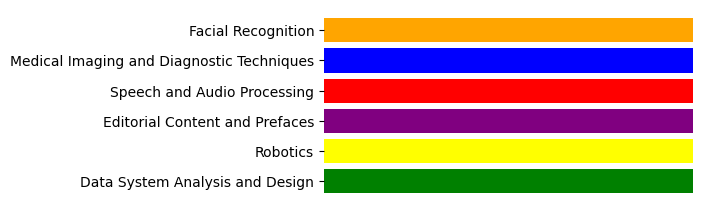

In [12]:
from cairo import *

x = list(str(i) for i in color_map.keys())
y = [5 for i in range(len(x))]
fig = plt.figure(figsize = (5,2.5))
ax1 = plt.axes(frameon=False)
ax1.axes.get_xaxis().set_visible(False)
plt.barh(x,y, 
         color = list(color_map.values()))
plt.show()

references_graph.vs["color"] = [color_map.get(topic_name, 'black') for topic_name in references_graph.vs["assigned_topic_name"]]
ig.plot(references_graph, vertex_size=5)

In [19]:
from igraph import Graph, plot
import pandas as pd

# Load the dataset
df_topic = pd.read_csv("/Users/zy/Documents/GitHub/Social-Media-Analysis-Project/Group Project/Topic Modeling and Results/cleaned_data_with_topics.csv")

# Drop rows with NaN values in 'id' or 'assigned_topic_name'
df_topic = df_topic.dropna(subset=['id', 'assigned_topic_name', 'references'])

# Convert 'id' and 'references' to string
df_topic['id'] = df_topic['id'].astype(str)
df_topic['references'] = df_topic['references'].astype(str)

# Create a color map for the topics
color_map = {
    'Data System Analysis and Design': 'green',
    'Robotics': 'yellow',
    'Editorial Content and Prefaces': 'purple',
    'Speech and Audio Processing': 'red',
    'Medical Imaging and Diagnostic Techniques': 'blue',
    'Facial Recognition': 'orange'
}

# Map the assigned topics to their names
exploded_data = df_topic.explode('references')
reference_doc = pd.concat([
    df_topic.loc[:, ['id', 'assigned_topic_name']].drop_duplicates(),
    exploded_data.loc[:, ['references', 'assigned_topic_name']].rename(columns={'references': 'id'})
], axis=0).sort_values(by=['id'])

reference_list = list(reference_doc['id'].values)
topic_list = list(reference_doc['assigned_topic_name'].values)
count = len(reference_list)

# Create an empty graph
references_graph = Graph(directed=False)
references_graph.add_vertices(count)

# Add edges between vertices based on references
for index, row in df_topic.iterrows():
    paper_id = row["id"]
    references = eval(row["references"]) if row["references"] else []
    valid_references = [ref_id for ref_id in references if ref_id in reference_list]
    for ref_id in valid_references:
        if ref_id not in reference_list:
            print(f"Invalid reference ID: {ref_id}")
        elif not references_graph.vs.find(name=ref_id):
            print(f"Vertex not found for ID: {ref_id}")
        else:
            references_graph.add_edge(ref_id, paper_id)

# Update node size based on number of citations
citation_counts = df_topic.groupby('id').size().to_dict()
vertex_sizes = [citation_counts.get(vid, 1) for vid in reference_list]

# Set vertex attributes for color and size
references_graph.vs['assigned_topic_name'] = topic_list
references_graph.vs['color'] = [color_map.get(topic_name, 'black') for topic_name in topic_list]
references_graph.vs['size'] = vertex_sizes

# Use a layout algorithm to position nodes
layout = references_graph.layout_fruchterman_reingold()

# Plot the graph
plot(references_graph, layout=layout, bbox=(800, 800), margin=50)

ValueError: no such vertex: '1267622'